In [1]:
#Importing libraries for data manipulation and linear algebra
import pandas as pd
import numpy as np

#Importing libraries for data visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

#Importing library train and test split
from sklearn.model_selection import train_test_split

#Importing library for train a model
from sklearn.ensemble import RandomForestClassifier

#Importing library for extract accuracy
from sklearn.metrics import accuracy_score

#Importing library for finding constant & quasi constant variance
from sklearn.feature_selection import VarianceThreshold

In [2]:
#Enable full view of the data
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
#Loading the data
train = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/Data-Files-for-Feature-Selection/master/santander-train.csv',
                   nrows = 1000)

In [4]:
#Checking the data
train.head()

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var1_0,ind_var1,ind_var2_0,ind_var2,ind_var5_0,ind_var5,ind_var6_0,ind_var6,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13_largo_0,ind_var13_largo,ind_var13_medio_0,ind_var13_medio,ind_var13,ind_var14_0,ind_var14,ind_var17_0,ind_var17,ind_var18_0,ind_var18,ind_var19,ind_var20_0,ind_var20,ind_var24_0,ind_var24,ind_var25_cte,ind_var26_0,ind_var26_cte,ind_var26,ind_var25_0,ind_var25,ind_var27_0,ind_var28_0,ind_var28,ind_var27,ind_var29_0,ind_var29,ind_var30_0,ind_var30,ind_var31_0,ind_var31,ind_var32_cte,ind_var32_0,ind_var32,ind_var33_0,ind_var33,ind_var34_0,ind_var34,ind_var37_cte,ind_var37_0,ind_var37,ind_var39_0,ind_var40_0,ind_var40,ind_var41_0,ind_var41,ind_var39,ind_var44_0,ind_var44,ind_var46_0,ind_var46,num_var1_0,num_var1,num_var4,num_var5_0,num_var5,num_var6_0,num_var6,num_var8_0,num_var8,num_var12_0,num_var12,num_var13_0,num_var13_corto_0,num_var13_corto,num_var13_largo_0,num_var13_largo,num_var13_medio_0,num_var13_medio,num_var13,num_var14_0,num_var14,num_var17_0,num_var17,num_var18_0,num_var18,num_var20_0,num_var20,num_var24_0,num_var24,num_var26_0,num_var26,num_var25_0,num_var25,num_op_var40_hace2,num_op_var40_hace3,num_op_var40_ult1,num_op_var40_ult3,num_op_var41_hace2,num_op_var41_hace3,num_op_var41_ult1,num_op_var41_ult3,num_op_var39_hace2,num_op_var39_hace3,num_op_var39_ult1,num_op_var39_ult3,num_var27_0,num_var28_0,num_var28,num_var27,num_var29_0,num_var29,num_var30_0,num_var30,num_var31_0,num_var31,num_var32_0,num_var32,num_var33_0,num_var33,num_var34_0,num_var34,num_var35,num_var37_med_ult2,num_var37_0,num_var37,num_var39_0,num_var40_0,num_var40,num_var41_0,num_var41,num_var39,num_var42_0,num_var42,num_var44_0,num_var44,num_var46_0,num_var46,saldo_var1,saldo_var5,saldo_var6,saldo_var8,saldo_var12,saldo_var13_corto,saldo_var13_largo,saldo_var13_medio,saldo_var13,saldo_var14,saldo_var17,saldo_var18,saldo_var20,saldo_var24,saldo_var26,saldo_var25,saldo_var28,saldo_var27,saldo_var29,saldo_var30,saldo_var31,saldo_var32,saldo_var33,saldo_var34,saldo_var37,saldo_var40,saldo_var41,saldo_var42,saldo_var44,saldo_var46,var36,delta_imp_amort_var18_1y3,delta_imp_amort_var34_1y3,delta_imp_aport_var13_1y3,delta_imp_aport_var17_1y3,delta_imp_aport_var33_1y3,delta_imp_compra_var44_1y3,delta_imp_reemb_var13_1y3,delta_imp_reemb_var17_1y3,delta_imp_reemb_var33_1y3,delta_imp_trasp_var17_in_1y3,delta_imp_trasp_var17_out_1y3,delta_imp_trasp_var33_in_1y3,delta_imp_trasp_var33_out_1y3,delta_imp_venta_var44_1y3,delta_num_aport_var13_1y3,delta_num_aport_var17_1y3,delta_num_aport_var33_1y3,delta_num_compra_var44_1y3,delta_num_reemb_var13_1y3,delta_num_reemb_var17_1y3,delta_num_reemb_var33_1y3,delta_num_trasp_var17_in_1y3,delta_num_trasp_var17_out_1y3,delta_num_trasp_var33_in_1y3,delta_num_trasp_var33_out_1y3,delta_num_venta_var44_1y3,imp_amort_var18_hace3,imp_amort_var18_ult1,imp_amort_var34_hace3,imp_amort_var34_ult1,imp_aport_var13_hace3,imp_aport_var13_ult1,imp_aport_var17_hace3,imp_aport_var17_ult1,imp_aport_var33_hace3,imp_aport_var33_ult1,imp_var7_emit_ult1,imp_var7_recib_ult1,imp_compra_var44_hace3,imp_compra_var44_ult1,imp_reemb_var13_hace3,imp_reemb_var13_ult1,imp_reemb_var17_hace3,imp_reemb_var17_ult1,imp_reemb_var33_hace3,imp_reemb_var33_ult1,imp_var43_emit_ult1,imp_trans_var37_ult1,imp_trasp_var17_in_hace3,imp_trasp_var17_in_ult1,imp_trasp_var17_out_hace3,imp_trasp_var17_out_ult1,imp_trasp_var33_in_hace3,imp_trasp_var33_in_ult1,imp_trasp_var33_out_hace3,imp_trasp_var33_out_ult1,imp_venta_var44_hace3,imp_venta_var44_ult1,ind_var7_emit_ult1,ind_var7_recib_ult1,ind_var10_ult1,ind_var10

In [5]:
#Checking the shape of the data
train.shape

(1000, 371)

Data have 1000 observations and 371 features

In [6]:
#Splitting data into X & y column wise
X = train.drop(columns = 'TARGET', axis=1)
y = train['TARGET']

#Checking the shape
X.shape, y.shape

((1000, 370), (1000,))

In [7]:
#Splitting X & y in train and test(80%-20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)

#Checking the shape of the data
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((800, 370), (800,), (200, 370), (200,))

#Constant features removal

In [8]:
#Creating constant filter
constant_filter = VarianceThreshold(threshold=0)

#Constant filter fit on the train data
constant_filter.fit(X_train)

VarianceThreshold(threshold=0)

In [9]:
#Checking the result
constant_filter.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True, False,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False, False,  True,  True,  True,  True,  True, False,
       False,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False, False, False, False,  True,  True,
        True,  True,  True,  True,  True,  True,  True, False, False,
       False, False,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True, False, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False, False,  True,  True,  True,
        True,  True, False, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

Above 'True' indicate non constant features and 'False' indicate constant features

In [10]:
#Checking total non-constant features
constant_filter.get_support().sum()

259

In [11]:
#Checking which are the features are constant
constant_features = X_train.columns[~constant_filter.get_support()]
constant_features

Index(['imp_op_var40_efect_ult1', 'ind_var2_0', 'ind_var2',
       'ind_var13_medio_0', 'ind_var13_medio', 'ind_var18_0', 'ind_var18',
       'ind_var27_0', 'ind_var28_0', 'ind_var28',
       ...
       'saldo_medio_var13_medio_hace3', 'saldo_medio_var13_medio_ult1',
       'saldo_medio_var13_medio_ult3', 'saldo_medio_var17_hace3',
       'saldo_medio_var29_hace2', 'saldo_medio_var29_hace3',
       'saldo_medio_var33_hace2', 'saldo_medio_var33_hace3',
       'saldo_medio_var33_ult1', 'saldo_medio_var33_ult3'],
      dtype='object', length=111)

In [12]:
#Checking which are the features are constant
non_constant_features = X_train.columns[constant_filter.get_support()]
non_constant_features

Index(['ID', 'var3', 'var15', 'imp_ent_var16_ult1', 'imp_op_var39_comer_ult1',
       'imp_op_var39_comer_ult3', 'imp_op_var40_comer_ult1',
       'imp_op_var40_comer_ult3', 'imp_op_var40_efect_ult3',
       'imp_op_var40_ult1',
       ...
       'saldo_medio_var17_hace2', 'saldo_medio_var17_ult1',
       'saldo_medio_var17_ult3', 'saldo_medio_var29_ult1',
       'saldo_medio_var29_ult3', 'saldo_medio_var44_hace2',
       'saldo_medio_var44_hace3', 'saldo_medio_var44_ult1',
       'saldo_medio_var44_ult3', 'var38'],
      dtype='object', length=259)

In [13]:
#Checking the count of constant and non constant features
print('Constant features:',len(constant_features))
print('Non-Constant features:',len(non_constant_features))

Constant features: 111
Non-Constant features: 259


In [14]:
#Viewing the constant features values in the data
for i in X_train[constant_features].columns:
  print(i,':')
  print(X_train[i].value_counts())
  print('---------------------------------------')

imp_op_var40_efect_ult1 :
0    800
Name: imp_op_var40_efect_ult1, dtype: int64
---------------------------------------
ind_var2_0 :
0    800
Name: ind_var2_0, dtype: int64
---------------------------------------
ind_var2 :
0    800
Name: ind_var2, dtype: int64
---------------------------------------
ind_var13_medio_0 :
0    800
Name: ind_var13_medio_0, dtype: int64
---------------------------------------
ind_var13_medio :
0    800
Name: ind_var13_medio, dtype: int64
---------------------------------------
ind_var18_0 :
0    800
Name: ind_var18_0, dtype: int64
---------------------------------------
ind_var18 :
0    800
Name: ind_var18, dtype: int64
---------------------------------------
ind_var27_0 :
0    800
Name: ind_var27_0, dtype: int64
---------------------------------------
ind_var28_0 :
0    800
Name: ind_var28_0, dtype: int64
---------------------------------------
ind_var28 :
0    800
Name: ind_var28, dtype: int64
---------------------------------------
ind_var27 :
0    800
N

As we found that 111 features have 0 values

In [15]:
#Removing constant features from the data
X_train_filter = constant_filter.transform(X_train)
X_test_filter = constant_filter.transform(X_test)

#Checking the shape of the data
X_train_filter.shape, X_test_filter.shape

((800, 259), (200, 259))

We have removed 111 constant variables from the data and now We have 259 variables

In [16]:
#Converting numpy array form of filter data into dataframe
X_train_filter = pd.DataFrame(X_train_filter, columns=non_constant_features)
X_test_filter = pd.DataFrame(X_test_filter, columns=non_constant_features)

# Quasi constant features removal

In [17]:
#Creating quasi constant filter
quasi_constant_filter = VarianceThreshold(threshold=0.01)

#Fit the quasi constant filter on the X_train_filter data
quasi_constant_filter.fit(X_train_filter)

VarianceThreshold(threshold=0.01)

In [18]:
#Checking the total of non quasi constant features
quasi_constant_filter.get_support().sum()

234

In [19]:
#Checking the result of quasi constant filter
quasi_constant_filter.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True, False,  True,  True, False, False,  True,  True,
        True,  True,  True,  True,  True, False, False,  True,  True,
       False, False, False, False, False, False,  True,  True,  True,
        True,  True,  True,  True,  True, False, False, False,  True,
       False, False, False, False, False,  True,  True,  True,  True,
        True, False,  True, False, False, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

Above 'True' are a non quasi constant features and 'False' are a quasi constant features

In [20]:
#Checking Which variables are a quasi constant features in the data
quasi_constant_features = X_train_filter.columns[~quasi_constant_filter.get_support()]
quasi_constant_features

Index(['ind_var1', 'ind_var6_0', 'ind_var6', 'ind_var13_largo_0',
       'ind_var13_largo', 'ind_var14', 'ind_var17_0', 'ind_var17', 'ind_var19',
       'ind_var20_0', 'ind_var20', 'ind_var29_0', 'ind_var29', 'ind_var30_0',
       'ind_var31_0', 'ind_var31', 'ind_var32_cte', 'ind_var32_0', 'ind_var32',
       'ind_var40', 'ind_var39', 'ind_var44_0', 'ind_var44',
       'ind_var7_recib_ult1', 'num_meses_var29_ult3'],
      dtype='object')

In [21]:
#Checking Which variables are a non-quasi constant features in the data
non_quasi_constant_features = X_train_filter.columns[quasi_constant_filter.get_support()]
non_quasi_constant_features

Index(['ID', 'var3', 'var15', 'imp_ent_var16_ult1', 'imp_op_var39_comer_ult1',
       'imp_op_var39_comer_ult3', 'imp_op_var40_comer_ult1',
       'imp_op_var40_comer_ult3', 'imp_op_var40_efect_ult3',
       'imp_op_var40_ult1',
       ...
       'saldo_medio_var17_hace2', 'saldo_medio_var17_ult1',
       'saldo_medio_var17_ult3', 'saldo_medio_var29_ult1',
       'saldo_medio_var29_ult3', 'saldo_medio_var44_hace2',
       'saldo_medio_var44_hace3', 'saldo_medio_var44_ult1',
       'saldo_medio_var44_ult3', 'var38'],
      dtype='object', length=234)

In [22]:
#Checking count of quasi constant and non quasi constant features
print('Quasi Constant Features:', len(quasi_constant_features))
print('Non-Quasi Constant Features:', len(non_quasi_constant_features))

Quasi Constant Features: 25
Non-Quasi Constant Features: 234


In [23]:
#Checking quasi constant features and its count
for i in X_train_filter[quasi_constant_features].columns:
  print(i,':')
  print(X_train_filter[i].value_counts())
  print('--------------------------------------')

ind_var1 :
0.0    794
1.0      6
Name: ind_var1, dtype: int64
--------------------------------------
ind_var6_0 :
0.0    799
1.0      1
Name: ind_var6_0, dtype: int64
--------------------------------------
ind_var6 :
0.0    799
1.0      1
Name: ind_var6, dtype: int64
--------------------------------------
ind_var13_largo_0 :
0.0    793
1.0      7
Name: ind_var13_largo_0, dtype: int64
--------------------------------------
ind_var13_largo :
0.0    793
1.0      7
Name: ind_var13_largo, dtype: int64
--------------------------------------
ind_var14 :
0.0    798
1.0      2
Name: ind_var14, dtype: int64
--------------------------------------
ind_var17_0 :
0.0    797
1.0      3
Name: ind_var17_0, dtype: int64
--------------------------------------
ind_var17 :
0.0    797
1.0      3
Name: ind_var17, dtype: int64
--------------------------------------
ind_var19 :
0.0    797
1.0      3
Name: ind_var19, dtype: int64
--------------------------------------
ind_var20_0 :
0.0    794
1.0      6
Name: i

In [24]:
#Removing quasi constant from the data
X_train_quasi_filter = quasi_constant_filter.transform(X_train_filter)
X_test_quasi_filter = quasi_constant_filter.transform(X_test_filter)

#Checking the shape of the data
X_train_quasi_filter.shape, X_test_quasi_filter.shape

((800, 234), (200, 234))

In [25]:
#Converting numpy array of data into dataframe
X_train_quasi_filter = pd.DataFrame(X_train_quasi_filter, columns=non_quasi_constant_features)
X_test_quasi_filter = pd.DataFrame(X_test_quasi_filter, columns=non_quasi_constant_features)

#Removing Duplicate Variables

In [26]:
#Transposing the data
X_train_T = X_train_quasi_filter.T
X_test_T = X_test_quasi_filter.T

In [27]:
#Checking the type of the data
type(X_train_T)

pandas.core.frame.DataFrame

In [28]:
#Checking shape of the data
X_train_T.shape, X_test_T.shape

((234, 800), (234, 200))

In [29]:
#Extracting count of duplicate rows
X_train_T.duplicated().sum()

33

In [30]:
#Checking the result of duplicate function
X_train_T.duplicated()

ID                               False
var3                             False
var15                            False
imp_ent_var16_ult1               False
imp_op_var39_comer_ult1          False
imp_op_var39_comer_ult3          False
imp_op_var40_comer_ult1          False
imp_op_var40_comer_ult3          False
imp_op_var40_efect_ult3          False
imp_op_var40_ult1                False
imp_op_var41_comer_ult1          False
imp_op_var41_comer_ult3          False
imp_op_var41_efect_ult1          False
imp_op_var41_efect_ult3          False
imp_op_var41_ult1                False
imp_op_var39_efect_ult1           True
imp_op_var39_efect_ult3          False
imp_op_var39_ult1                False
imp_sal_var16_ult1               False
ind_var1_0                       False
ind_var5_0                       False
ind_var5                         False
ind_var8_0                       False
ind_var8                         False
ind_var12_0                      False
ind_var12                

In [31]:
#Transpose the rows into columns which was previously transposed columns into rows
X_train_NT = X_train_T.T
X_test_NT = X_test_T.T

In [32]:
#Checking data
X_train_NT

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var1_0,ind_var5_0,ind_var5,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13,ind_var14_0,ind_var24_0,ind_var24,ind_var25_cte,ind_var26_0,ind_var26_cte,ind_var26,ind_var25_0,ind_var25,ind_var30,ind_var37_cte,ind_var37_0,ind_var37,ind_var39_0,ind_var40_0,ind_var41_0,num_var1_0,num_var1,num_var4,num_var5_0,num_var5,num_var6_0,num_var6,num_var8_0,num_var8,num_var12_0,num_var12,num_var13_0,num_var13_corto_0,num_var13_corto,num_var13_largo_0,num_var13_largo,num_var13,num_var14_0,num_var14,num_var17_0,num_var17,num_var20_0,num_var20,num_var24_0,num_var24,num_var26_0,num_var26,num_var25_0,num_var25,num_op_var40_hace2,num_op_var40_hace3,num_op_var40_ult1,num_op_var40_ult3,num_op_var41_hace2,num_op_var41_hace3,num_op_var41_ult1,num_op_var41_ult3,num_op_var39_hace2,num_op_var39_hace3,num_op_var39_ult1,num_op_var39_ult3,num_var29_0,num_var29,num_var30_0,num_var30,num_var31_0,num_var31,num_var32_0,num_var32,num_var35,num_var37_med_ult2,num_var37_0,num_var37,num_var39_0,num_var40_0,num_var40,num_var41_0,num_var39,num_var42_0,num_var42,num_var44_0,num_var44,saldo_var1,saldo_var5,saldo_var6,saldo_var8,saldo_var12,saldo_var13_corto,saldo_var13_largo,saldo_var13,saldo_var14,saldo_var17,saldo_var20,saldo_var24,saldo_var26,saldo_var25,saldo_var29,saldo_var30,saldo_var31,saldo_var32,saldo_var37,saldo_var40,saldo_var42,saldo_var44,var36,delta_imp_aport_var13_1y3,delta_imp_aport_var17_1y3,delta_imp_compra_var44_1y3,delta_imp_reemb_var13_1y3,delta_imp_trasp_var17_in_1y3,delta_imp_venta_var44_1y3,delta_num_aport_var13_1y3,delta_num_aport_var17_1y3,delta_num_compra_var44_1y3,delta_num_reemb_var13_1y3,delta_num_trasp_var17_in_1y3,delta_num_venta_var44_1y3,imp_aport_var13_hace3,imp_aport_var13_ult1,imp_aport_var17_ult1,imp_var7_recib_ult1,imp_compra_var44_hace3,imp_compra_var44_ult1,imp_reemb_var13_ult1,imp_var43_emit_ult1,imp_trans_var37_ult1,imp_trasp_var17_in_ult1,imp_venta_var44_ult1,ind_var10_ult1,ind_var10cte_ult1,ind_var9_cte_ult1,ind_var9_ult1,ind_var43_emit_ult1,ind_var43_recib_ult1,var21,num_aport_var13_hace3,num_aport_var13_ult1,num_aport_var17_ult1,num_var7_recib_ult1,num_compra_var44_hace3,num_compra_var44_ult1,num_ent_var16_ult1,num_var22_hace2,num_var22_hace3,num_var22_ult1,num_var22_ult3,num_med_var22_ult3,num_med_var45_ult3,num_meses_var5_ult3,num_meses_var8_ult3,num_meses_var12_ult3,num_meses_var13_corto_ult3,num_meses_var13_largo_ult3,num_meses_var17_ult3,num_meses_var39_vig_ult3,num_meses_var44_ult3,num_op_var39_comer_ult1,num_op_var39_comer_ult3,num_op_var40_comer_ult1,num_op_var40_comer_ult3,num_op_var40_efect_ult3,num_op_var41_comer_ult1,num_op_var41_comer_ult3,num_op_var41_efect_ult1,num_op_var41_efect_ult3,num_op_var39_efect_ult1,num_op_var39_efect_ult3,num_reemb_var13_ult1,num_sal_var16_ult1,num_var43_emit_ult1,num_var43_recib_ult1,num_trasp_var11_ult1,num_trasp_var17_in_ult1,num_venta_var44_ult1,num_var45_hace2,num_var45_hace3,num_var45_ult1,num_var45_ult3,saldo_medio_var5_hace2,saldo_medio_var5_hace3,saldo_medio_var5_ult1,saldo_medio_var5_ult3,saldo_medio_var8_hace2,saldo_medio_var8_hace3,saldo_medio_var8_ult1,saldo_medio_var8_ult3,saldo_medio_var12_hace2,saldo_medio_var12_hace3,saldo_medio_var12_ult1,saldo_medio_var12_ult3,saldo_medio_var13_corto_hace2,saldo_medio_var13_corto_hace3,saldo_medio_var13_corto_ult1,saldo_medio_var13_corto_ult3,saldo_medio_var13_largo_hace2,saldo_medio_var13_largo_hace3,saldo_medio_var13_largo_ult1,saldo_medio_var13_largo_ult3,saldo_medio_var17_hace2,saldo_medio_var17_ult1,saldo_medio_var17_ult3,saldo_medio_var29_ult1,saldo_medio_var29_ult3,saldo_medio_var44_hace2,saldo_medio_var44_h

In [33]:
#Extracting duplicate features from the data
duplicate_features = X_train_NT.columns[X_train_T.duplicated()]
duplicate_features

Index(['imp_op_var39_efect_ult1', 'ind_var26', 'ind_var25', 'ind_var37',
       'ind_var40_0', 'num_var6', 'num_var13_largo', 'num_var17', 'num_var26',
       'num_var25', 'num_var29_0', 'num_var29', 'num_var31', 'num_var32',
       'num_var37', 'num_var40_0', 'num_var40', 'num_var39', 'num_var44',
       'saldo_var29', 'saldo_var40', 'delta_imp_trasp_var17_in_1y3',
       'delta_num_aport_var13_1y3', 'delta_num_aport_var17_1y3',
       'delta_num_compra_var44_1y3', 'delta_num_reemb_var13_1y3',
       'delta_num_trasp_var17_in_1y3', 'delta_num_venta_var44_1y3',
       'imp_trasp_var17_in_ult1', 'num_op_var39_efect_ult1',
       'num_trasp_var17_in_ult1', 'num_venta_var44_ult1',
       'saldo_medio_var29_ult3'],
      dtype='object')

In [34]:
#Extracting non-duplicate features from the data
non_duplicate_features = X_train_NT.columns[~X_train_T.duplicated()]
non_duplicate_features

Index(['ID', 'var3', 'var15', 'imp_ent_var16_ult1', 'imp_op_var39_comer_ult1',
       'imp_op_var39_comer_ult3', 'imp_op_var40_comer_ult1',
       'imp_op_var40_comer_ult3', 'imp_op_var40_efect_ult3',
       'imp_op_var40_ult1',
       ...
       'saldo_medio_var13_largo_ult3', 'saldo_medio_var17_hace2',
       'saldo_medio_var17_ult1', 'saldo_medio_var17_ult3',
       'saldo_medio_var29_ult1', 'saldo_medio_var44_hace2',
       'saldo_medio_var44_hace3', 'saldo_medio_var44_ult1',
       'saldo_medio_var44_ult3', 'var38'],
      dtype='object', length=201)

In [35]:
#Checking count of duplicate and non duplicate features
print('Duplicate features:', len(duplicate_features))
print('Non Duplicate features:',len(non_duplicate_features))

Duplicate features: 33
Non Duplicate features: 201


In [36]:
#Removing duplicate features from the data
X_train_unique = X_train_NT[non_duplicate_features]
X_test_unique = X_test_NT[non_duplicate_features]

#Checking the shape of the data
X_train_unique.shape, X_test_unique.shape

((800, 201), (200, 201))

In [37]:
#Creating function for train a model on data
def classifier(model, X_train, X_test, y_train, y_test):
  model.fit(X_train, y_train)
  y_pred = model.predict(X_test)
  accuracy = accuracy_score(y_test, y_pred)
  return accuracy

In [38]:
%%time
#Train a model, predict on the model and extract accuracy
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
print('Accuracy on 201 unique variables 201:',classifier(rf, X_train_unique, X_test_unique, y_train, y_test))

Accuracy on 201 unique variables 201: 0.96
CPU times: user 366 ms, sys: 7.4 ms, total: 374 ms
Wall time: 597 ms


In [39]:
%%time
#Train a model, predict on the model and extract accuracy
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
print('Accuracy on 370 original variables:',classifier(rf, X_train, X_test, y_train, y_test))

Accuracy on 370 original variables: 0.96
CPU times: user 393 ms, sys: 8.77 ms, total: 402 ms
Wall time: 583 ms


# Correlation Filter Method

In [40]:
#Creating correlation matrix
corr_matrix = X_train_unique.corr()
corr_matrix

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var1_0,ind_var5_0,ind_var5,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13,ind_var14_0,ind_var24_0,ind_var24,ind_var25_cte,ind_var26_0,ind_var26_cte,ind_var25_0,ind_var30,ind_var37_cte,ind_var37_0,ind_var39_0,ind_var41_0,num_var1_0,num_var1,num_var4,num_var5_0,num_var5,num_var6_0,num_var8_0,num_var8,num_var12_0,num_var12,num_var13_0,num_var13_corto_0,num_var13_corto,num_var13_largo_0,num_var13,num_var14_0,num_var14,num_var17_0,num_var20_0,num_var20,num_var24_0,num_var24,num_var26_0,num_var25_0,num_op_var40_hace2,num_op_var40_hace3,num_op_var40_ult1,num_op_var40_ult3,num_op_var41_hace2,num_op_var41_hace3,num_op_var41_ult1,num_op_var41_ult3,num_op_var39_hace2,num_op_var39_hace3,num_op_var39_ult1,num_op_var39_ult3,num_var30_0,num_var30,num_var31_0,num_var32_0,num_var35,num_var37_med_ult2,num_var37_0,num_var39_0,num_var41_0,num_var42_0,num_var42,num_var44_0,saldo_var1,saldo_var5,saldo_var6,saldo_var8,saldo_var12,saldo_var13_corto,saldo_var13_largo,saldo_var13,saldo_var14,saldo_var17,saldo_var20,saldo_var24,saldo_var26,saldo_var25,saldo_var30,saldo_var31,saldo_var32,saldo_var37,saldo_var42,saldo_var44,var36,delta_imp_aport_var13_1y3,delta_imp_aport_var17_1y3,delta_imp_compra_var44_1y3,delta_imp_reemb_var13_1y3,delta_imp_venta_var44_1y3,imp_aport_var13_hace3,imp_aport_var13_ult1,imp_aport_var17_ult1,imp_var7_recib_ult1,imp_compra_var44_hace3,imp_compra_var44_ult1,imp_reemb_var13_ult1,imp_var43_emit_ult1,imp_trans_var37_ult1,imp_venta_var44_ult1,ind_var10_ult1,ind_var10cte_ult1,ind_var9_cte_ult1,ind_var9_ult1,ind_var43_emit_ult1,ind_var43_recib_ult1,var21,num_aport_var13_hace3,num_aport_var13_ult1,num_aport_var17_ult1,num_var7_recib_ult1,num_compra_var44_hace3,num_compra_var44_ult1,num_ent_var16_ult1,num_var22_hace2,num_var22_hace3,num_var22_ult1,num_var22_ult3,num_med_var22_ult3,num_med_var45_ult3,num_meses_var5_ult3,num_meses_var8_ult3,num_meses_var12_ult3,num_meses_var13_corto_ult3,num_meses_var13_largo_ult3,num_meses_var17_ult3,num_meses_var39_vig_ult3,num_meses_var44_ult3,num_op_var39_comer_ult1,num_op_var39_comer_ult3,num_op_var40_comer_ult1,num_op_var40_comer_ult3,num_op_var40_efect_ult3,num_op_var41_comer_ult1,num_op_var41_comer_ult3,num_op_var41_efect_ult1,num_op_var41_efect_ult3,num_op_var39_efect_ult3,num_reemb_var13_ult1,num_sal_var16_ult1,num_var43_emit_ult1,num_var43_recib_ult1,num_trasp_var11_ult1,num_var45_hace2,num_var45_hace3,num_var45_ult1,num_var45_ult3,saldo_medio_var5_hace2,saldo_medio_var5_hace3,saldo_medio_var5_ult1,saldo_medio_var5_ult3,saldo_medio_var8_hace2,saldo_medio_var8_hace3,saldo_medio_var8_ult1,saldo_medio_var8_ult3,saldo_medio_var12_hace2,saldo_medio_var12_hace3,saldo_medio_var12_ult1,saldo_medio_var12_ult3,saldo_medio_var13_corto_hace2,saldo_medio_var13_corto_hace3,saldo_medio_var13_corto_ult1,saldo_medio_var13_corto_ult3,saldo_medio_var13_largo_hace2,saldo_medio_var13_largo_hace3,saldo_medio_var13_largo_ult1,saldo_medio_var13_largo_ult3,saldo_medio_var17_hace2,saldo_medio_var17_ult1,saldo_medio_var17_ult3,saldo_medio_var29_ult1,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38
ID,1.000000,-0.034763,0.008015,0.050722,0.016172,-0.006299,0.029002,-0.000767,-0.057875,-0.007472,0.010293,-0.006506,-0.003394,-0.003089,-0.001157,-0.006658,-0.002422,0.004385,-0.005741,0.031057,-0.007546,-0.036262,-0.028771,-0.043417,-0.014738,-0.049590,-0.046977,-0.050005,-0.052301,-0.043061,-0.030450,-0.020740,-0.021532,-0.003443,-0.012260,-0.013128,-0.031256,-0.050932,-0.042633,-0.038855,-0.033589,-0.005741,-0.007750,-0.032545,0.033707,-0.007546,0.053985,-0.036262,-0.028771,-0.0

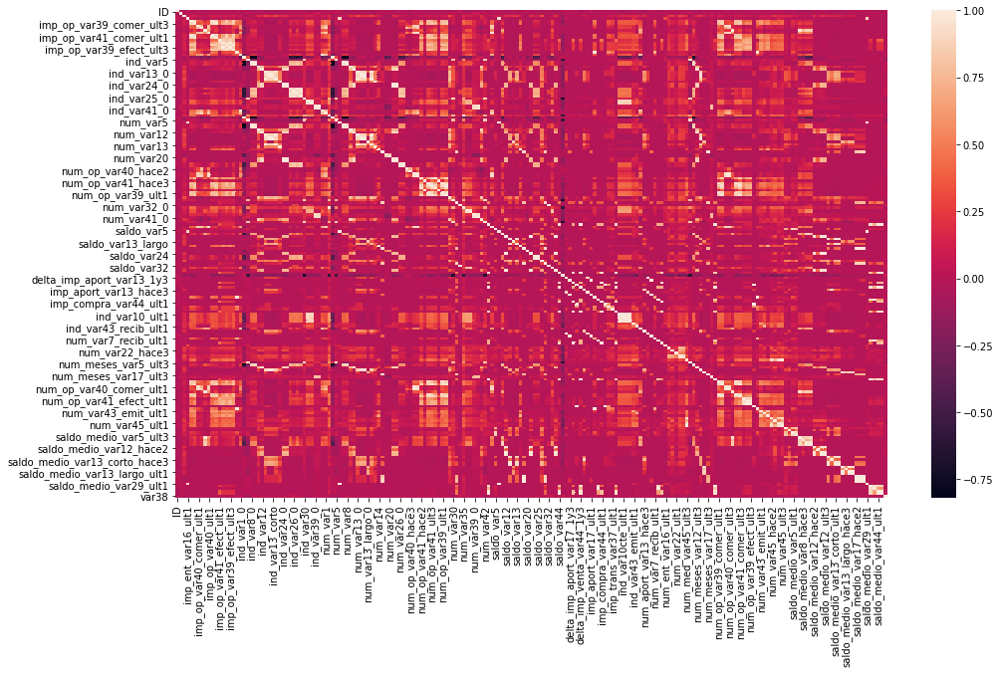

In [41]:
#Creating heatmap on correlation matrix
plt.figure(figsize = (16,9))
sns.heatmap(corr_matrix);

In [ ]:
#Creating function which extract the correlated features have a correlation greater than 0.85
# def extract_correlation(data, threshold):
#   corr_matrix_abs = abs(data.corr())
#   correlated_features = set()
#   for i in corr_matrix_abs.columns:
#     for j in corr_matrix_abs.keys():
#       if (i!=j) & (corr_matrix_abs[i][j]>threshold):
#         correlated_features.add(i)
#   return correlated_features

In [130]:
#Creating function of extracting correlated features from the correlated matrix
def high_correlation(data, threshold):
  correlated_features = set()
  correlated_matrix = data.corr().abs()
  for i in range(len(correlated_matrix.columns)):
    for j in range(i):
      if correlated_matrix.iloc[i,j]>threshold:
        colnames = correlated_matrix.columns[i]
        correlated_features.add(colnames)
  return correlated_features

In [134]:
#Extracting correlated features have correlation values >0.85
correlated_features = high_correlation(X_train_unique, 0.85)
correlated_features

{'delta_imp_compra_var44_1y3',
 'delta_imp_venta_var44_1y3',
 'imp_aport_var13_ult1',
 'imp_aport_var17_ult1',
 'imp_compra_var44_ult1',
 'imp_op_var39_comer_ult3',
 'imp_op_var39_efect_ult3',
 'imp_op_var39_ult1',
 'imp_op_var41_comer_ult1',
 'imp_op_var41_comer_ult3',
 'imp_op_var41_efect_ult3',
 'imp_op_var41_ult1',
 'imp_reemb_var13_ult1',
 'imp_var7_recib_ult1',
 'imp_venta_var44_ult1',
 'ind_var10_ult1',
 'ind_var10cte_ult1',
 'ind_var13',
 'ind_var13_corto',
 'ind_var13_corto_0',
 'ind_var24',
 'ind_var24_0',
 'ind_var25_0',
 'ind_var26_0',
 'ind_var26_cte',
 'ind_var30',
 'ind_var37_0',
 'ind_var41_0',
 'ind_var8',
 'ind_var9_cte_ult1',
 'ind_var9_ult1',
 'num_aport_var13_ult1',
 'num_aport_var17_ult1',
 'num_compra_var44_hace3',
 'num_compra_var44_ult1',
 'num_med_var22_ult3',
 'num_meses_var12_ult3',
 'num_meses_var13_corto_ult3',
 'num_meses_var17_ult3',
 'num_meses_var44_ult3',
 'num_meses_var5_ult3',
 'num_meses_var8_ult3',
 'num_op_var39_comer_ult1',
 'num_op_var39_comer_

In [135]:
#Checking count of correlated features
len(correlated_features)

124

In [136]:
#Removing 124 correlated features from the data
X_train_uncorr = X_train_unique.drop(columns = correlated_features, axis = 1)
X_test_uncorr =  X_test_unique.drop(columns = correlated_features, axis = 1)

#Checking shape of the data
X_train_uncorr.shape, X_test_uncorr.shape

((800, 77), (200, 77))

In [137]:
%%time
#Train a model, predict on the model and extract accuracy
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
print('Accuracy on 77 uncorrelated variables:',classifier(rf, X_train_uncorr, X_test_uncorr, y_train, y_test))

Accuracy on 77 uncorrelated variables: 0.96
CPU times: user 321 ms, sys: 38.6 ms, total: 360 ms
Wall time: 363 ms


In [138]:
%%time
#Train a model, predict on the model and extract accuracy
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
print('Accuracy on 370 original variables:',classifier(rf, X_train, X_test, y_train, y_test))

Accuracy on 370 original variables: 0.96
CPU times: user 362 ms, sys: 40.8 ms, total: 403 ms
Wall time: 456 ms


We have created model on uncorrelated features where We got 96% model accuracy and it took 363 ms whereas We have created model on original data where We got 96% and it took 456 ms

Conclusion:
It helped us to reduced time computation